<a href="https://colab.research.google.com/github/ashutoshb206/Duplicate_Question-pair_Quora/blob/main/BOW_advance_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import re
from bs4 import BeautifulSoup

import warnings
warnings.filterwarnings('ignore')

In [8]:
df = pd.read_csv('/content/train3.csv', on_bad_lines='skip')

In [4]:
try:
    with open('/content/train3.csv', 'r') as f:
        for i in range(10): # Read the first 10 lines
            line = f.readline()
            print(f"Line {i+1}: {line.strip()}")
except Exception as e:
    print(f"Error reading file: {e}")

Error reading file: [Errno 2] No such file or directory: '/content/train3.csv'


In [5]:
try:
    with open('/content/train3.csv', 'r') as f:
        for i, line in enumerate(f):
            if i >= 27250 and i <= 27260: # Check lines around the error row
                 print(f"Line {i+1}: {line.strip()}")
            if i > 27260:
                break # Stop after checking the relevant lines
except Exception as e:
    print(f"Error reading file: {e}")

Error reading file: [Errno 2] No such file or directory: '/content/train3.csv'


In [11]:
df.head()
df.shape

(148145, 6)

In [12]:
new_df = df.sample(40000,random_state=2)

In [14]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate
91151,91151,152808.0,152809.0,How does microdermabrasion get rid of blackheads?,What is the best way to ask your professor to ...,0.0
111947,111947,183250.0,183251.0,How many times has Donald Trump filed for bank...,How many of Donald Trump's children are Jewish?,0.0
6167,6167,12089.0,12090.0,What type of holidays are luxurious and why?,What type of luxury holidays are there?,1.0
117146,117146,190683.0,190684.0,Can you get rich from the stock market?,How I could become rich from stock markets?,1.0
58131,58131,7167.0,16519.0,What is the best way to increase traffic for a...,How do I increase traffic on my site?,1.0


In [15]:
def preprocess(q):

    q = str(q).lower().strip()

    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')

    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')

    # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)

    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = {
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")

    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()

    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()


    return q


In [16]:
preprocess("I've already! wasn't <b>done</b>?")

'i have already  was not done'

In [17]:
new_df['question1'] = new_df['question1'].apply(preprocess)
new_df['question2'] = new_df['question2'].apply(preprocess)

In [18]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0


In [19]:
new_df['q1_len'] = new_df['question1'].str.len()
new_df['q2_len'] = new_df['question2'].str.len()

In [21]:
new_df['q1_num_words'] = new_df['question1'].apply(lambda row: len(row.split(" ")))
new_df['q2_num_words'] = new_df['question2'].apply(lambda row: len(row.split(" ")))

In [22]:
def common_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
    return len(w1 & w2)

In [23]:
new_df['word_common'] = new_df.apply(common_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,q2_num_words,word_common
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,14,0
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,9,4
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,7,5
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,8,3
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,8,2


In [24]:
def total_words(row):
    w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
    return (len(w1) + len(w2))


In [25]:
new_df['word_total'] = new_df.apply(total_words, axis=1)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,q2_num_words,word_common,word_total
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,14,0,19
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,9,4,18
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,7,5,15
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,8,3,16
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,8,2,20


In [26]:
new_df['word_share'] = round(new_df['word_common']/new_df['word_total'],2)
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,q2_num_words,word_common,word_total,word_share
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,14,0,19,0.00
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,9,4,18,0.22
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,7,5,15,0.33
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,8,3,16,0.19
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,8,2,20,0.10


**ADVANCED FEATURES**

In [27]:
# Advanced Features
from nltk.corpus import stopwords

def fetch_token_features(row):

    q1 = row['question1']
    q2 = row['question2']

    SAFE_DIV = 0.0001

    STOP_WORDS = stopwords.words("english")

    token_features = [0.0]*8

    # Converting the Sentence into Tokens:
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])

    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])

    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))

    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))

    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))


    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)

    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])

    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])

    return token_features


In [29]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [30]:
token_features = new_df.apply(fetch_token_features, axis=1)

new_df["cwc_min"]       = list(map(lambda x: x[0], token_features))
new_df["cwc_max"]       = list(map(lambda x: x[1], token_features))
new_df["csc_min"]       = list(map(lambda x: x[2], token_features))
new_df["csc_max"]       = list(map(lambda x: x[3], token_features))
new_df["ctc_min"]       = list(map(lambda x: x[4], token_features))
new_df["ctc_max"]       = list(map(lambda x: x[5], token_features))
new_df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
new_df["first_word_eq"] = list(map(lambda x: x[7], token_features))

In [31]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,...,word_total,word_share,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,...,19,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,...,18,0.22,0.599988,0.499992,0.333322,0.249994,0.444440,0.444440,0.0,1.0
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,...,15,0.33,0.666644,0.666644,0.749981,0.599988,0.714276,0.624992,0.0,1.0
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,...,16,0.19,0.499988,0.399992,0.333322,0.249994,0.374995,0.374995,0.0,0.0
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,...,20,0.10,0.666644,0.333328,0.000000,0.000000,0.249997,0.166665,0.0,0.0


In [34]:
# apply 3 more length based features
import distance

def fetch_length_features(row):

    q1 = row['question1']
    q2 = row['question2']

    length_features = [0.0]*3

    # Converting the Sentence into Tokens:
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features

    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))

    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2

    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)

    return length_features


In [35]:
length_features = new_df.apply(fetch_length_features, axis=1)

new_df['abs_len_diff'] = list(map(lambda x: x[0], length_features))
new_df['mean_len'] = list(map(lambda x: x[1], length_features))
new_df['longest_substr_ratio'] = list(map(lambda x: x[2], length_features))

In [37]:
new_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,...,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,7.0,10.5,0.040816
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,...,0.499992,0.333322,0.249994,0.444440,0.444440,0.0,1.0,0.0,9.0,0.297872
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,...,0.666644,0.749981,0.599988,0.714276,0.624992,0.0,1.0,1.0,7.5,0.358974
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,...,0.399992,0.333322,0.249994,0.374995,0.374995,0.0,0.0,0.0,8.0,0.333333
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,...,0.333328,0.000000,0.000000,0.249997,0.166665,0.0,0.0,4.0,10.0,0.486486


Applying 3 Fuzzy features


In [39]:
# Fuzzy Features
from fuzzywuzzy import fuzz

def fetch_fuzzy_features(row):

    q1 = row['question1']
    q2 = row['question2']

    fuzzy_features = [0.0]*4

    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [40]:
fuzzy_features = new_df.apply(fetch_fuzzy_features, axis=1)

# Creating new feature columns for fuzzy features
new_df['fuzz_ratio'] = list(map(lambda x: x[0], fuzzy_features))
new_df['fuzz_partial_ratio'] = list(map(lambda x: x[1], fuzzy_features))
new_df['token_sort_ratio'] = list(map(lambda x: x[2], fuzzy_features))
new_df['token_set_ratio'] = list(map(lambda x: x[3], fuzzy_features))

In [41]:
print(new_df.shape)
new_df.head()


(40000, 29)


,id,qid1,qid2,question1,question2,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,longest_substr_ratio,fuzz_ratio,fuzz_partial_ratio,token_sort_ratio,token_set_ratio
91151,91151,152808.0,152809.0,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...,0.0,48,71,7,7,...,0.000000,0.0,0.0,7.0,10.5,0.040816,17,27,20,20
111947,111947,183250.0,183251.0,how many times has donald trump filed for bank...,how many of donald trump s children are jewish,0.0,52,46,9,9,...,0.444440,0.0,1.0,0.0,9.0,0.297872,59,61,53,65
6167,6167,12089.0,12090.0,what type of holidays are luxurious and why,what type of luxury holidays are there,1.0,43,38,8,8,...,0.624992,0.0,1.0,1.0,7.5,0.358974,67,71,77,81
117146,117146,190683.0,190684.0,can you get rich from the stock market,how i could become rich from stock markets,1.0,38,42,8,8,...,0.374995,0.0,0.0,0.0,8.0,0.333333,70,76,62,62
58131,58131,7167.0,16519.0,what is the best way to increase traffic for a...,how do i increase traffic on my site,1.0,55,36,12,12,...,0.166665,0.0,0.0,4.0,10.0,0.486486,55,64,48,62


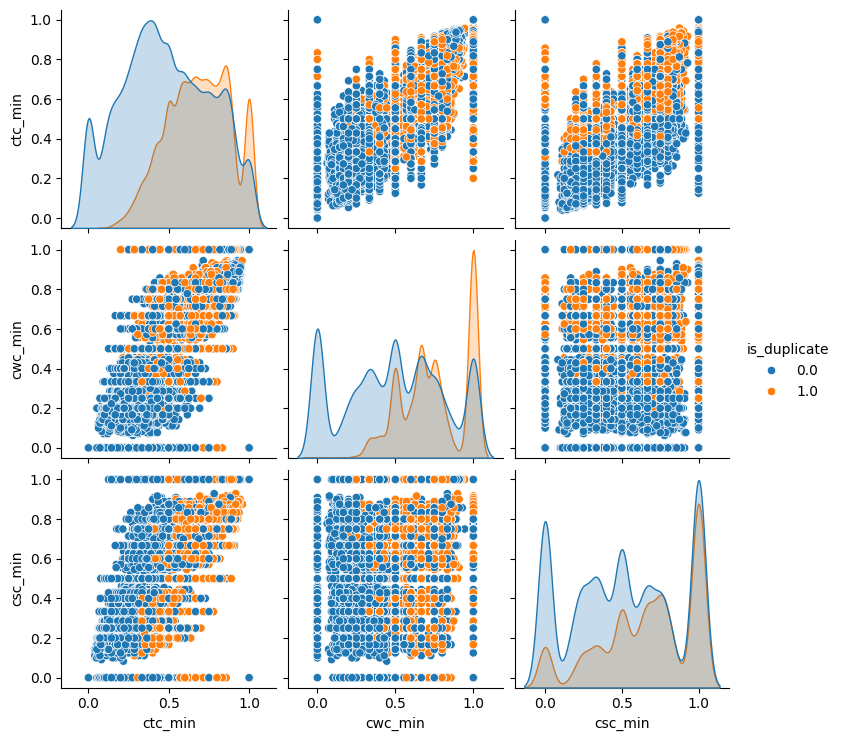

In [42]:
#pairplot of all min features
sns.pairplot(new_df[['ctc_min', 'cwc_min', 'csc_min', 'is_duplicate']],hue='is_duplicate')

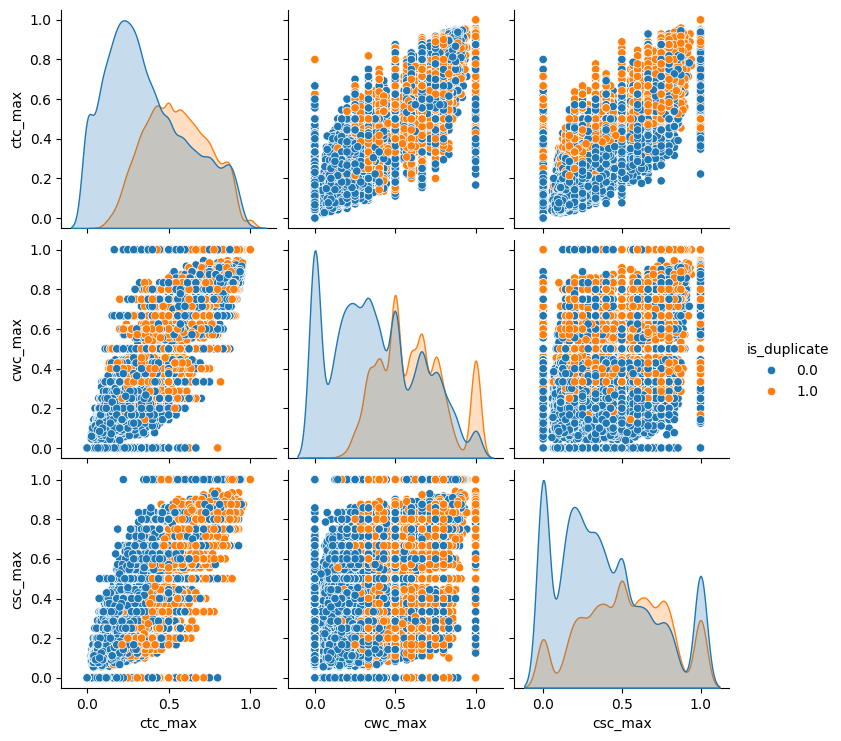

In [43]:
#pairplot of all max features
sns.pairplot(new_df[['ctc_max', 'cwc_max', 'csc_max', 'is_duplicate']],hue='is_duplicate')

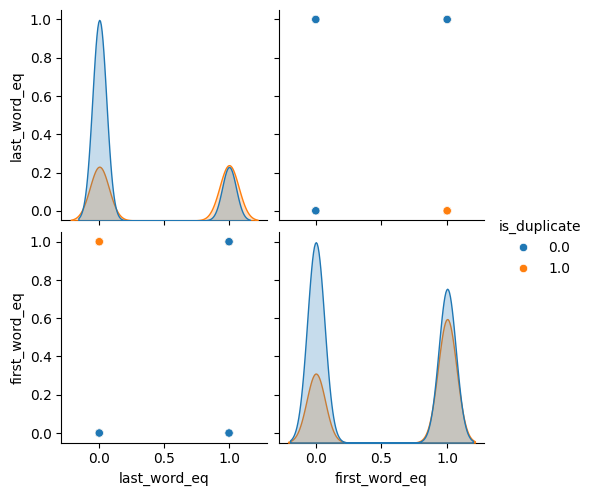

In [44]:
#pairplot of last,first word features
sns.pairplot(new_df[['last_word_eq', 'first_word_eq', 'is_duplicate']],hue='is_duplicate')

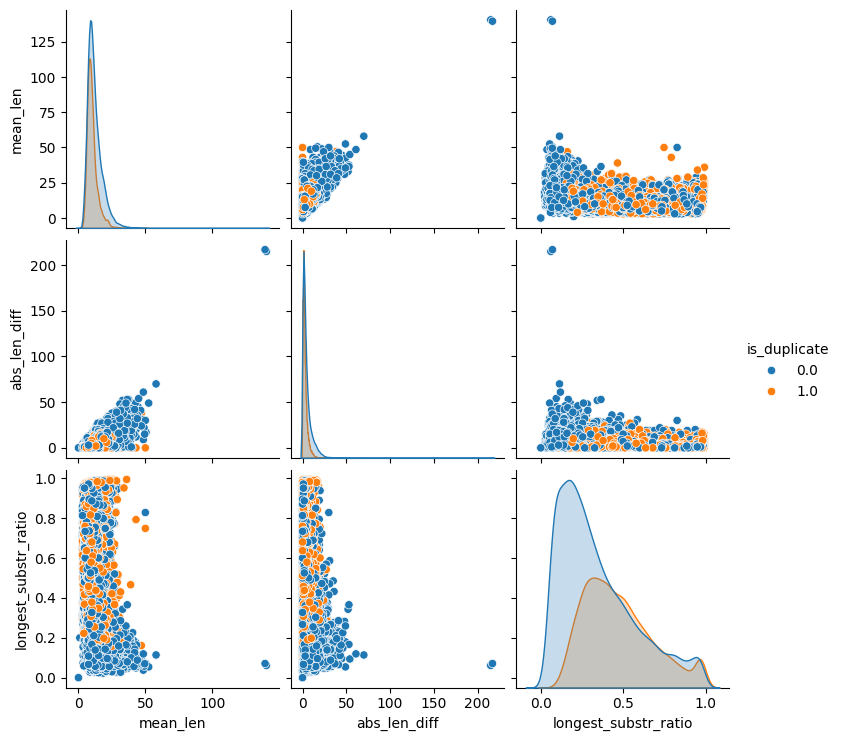

In [45]:
sns.pairplot(new_df[['mean_len', 'abs_len_diff','longest_substr_ratio', 'is_duplicate']],hue='is_duplicate')

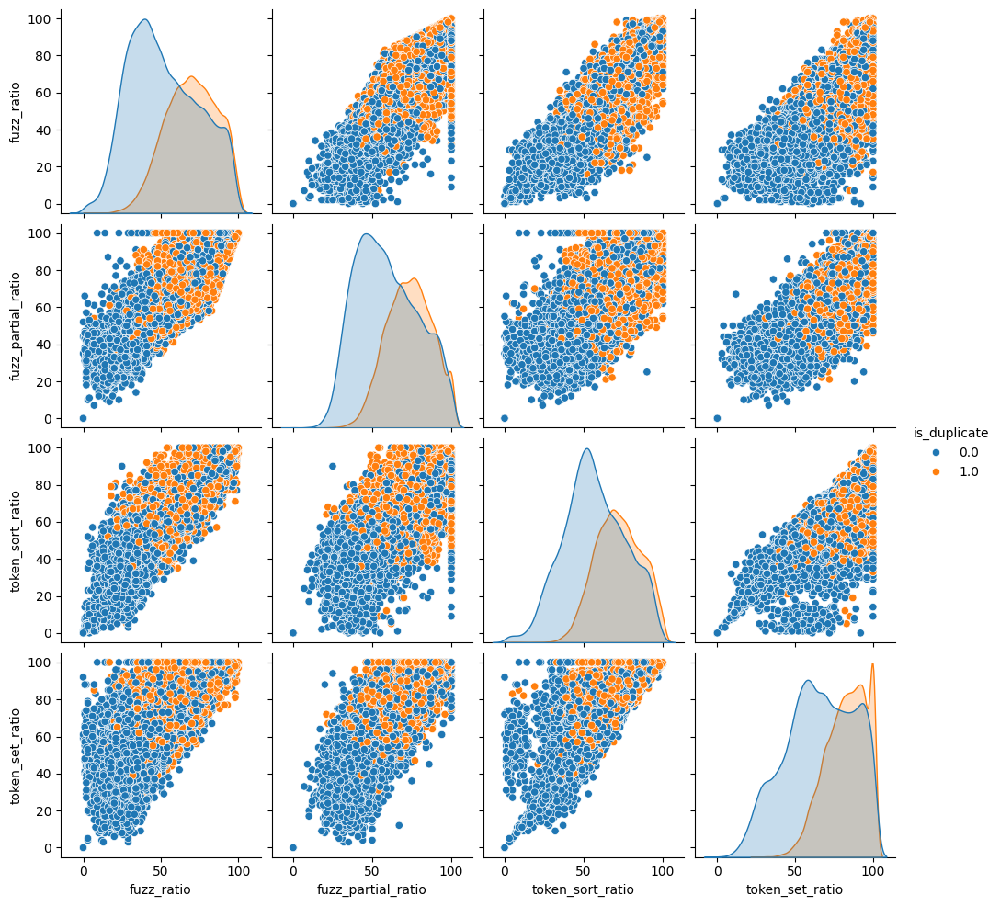

In [46]:
sns.pairplot(new_df[['fuzz_ratio', 'fuzz_partial_ratio','token_sort_ratio','token_set_ratio', 'is_duplicate']],hue='is_duplicate')

MinMaxScaler → scales the data (keeps same number of features, just changes values).

t-SNE → reduces dimensions (changes how many features you have).

In [47]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

X = MinMaxScaler().fit_transform(new_df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = new_df['is_duplicate'].values

In [48]:
from sklearn.manifold import TSNE

tsne2d = TSNE(
    n_components=2,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40000 samples in 0.278s...
[t-SNE] Computed neighbors for 40000 samples in 14.111s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for sa

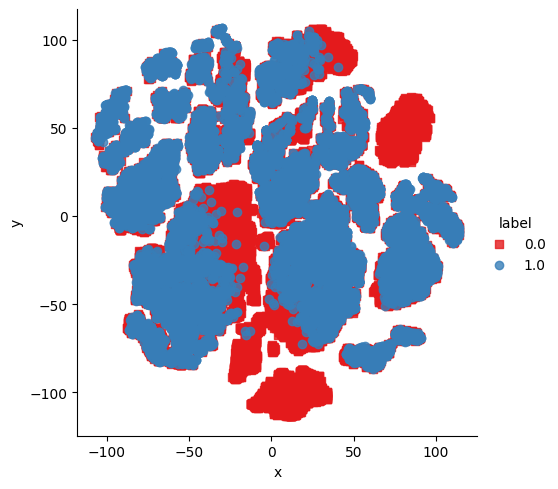

In [50]:
x_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=x_df, x='x', y='y', hue='label', fit_reg=False,palette="Set1",markers=['s','o'])


In [54]:
from sklearn.manifold import TSNE

tsne3d = TSNE(
    n_components=3,
    init='pca', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40000 samples in 0.122s...
[t-SNE] Computed neighbors for 40000 samples in 11.688s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40000
[t-SNE] Computed conditional probabilities for sample 2000 / 40000
[t-SNE] Computed conditional probabilities for sample 3000 / 40000
[t-SNE] Computed conditional probabilities for sample 4000 / 40000
[t-SNE] Computed conditional probabilities for sample 5000 / 40000
[t-SNE] Computed conditional probabilities for sample 6000 / 40000
[t-SNE] Computed conditional probabilities for sample 7000 / 40000
[t-SNE] Computed conditional probabilities for sample 8000 / 40000
[t-SNE] Computed conditional probabilities for sample 9000 / 40000
[t-SNE] Computed conditional probabilities for sample 10000 / 40000
[t-SNE] Computed conditional probabilities for sample 11000 / 40000
[t-SNE] Computed conditional probabilities for sample 12000 / 40000
[t-SNE] Computed conditional probabilities for sa

In [57]:
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

**USING UMAP**

In [56]:
# for dimensionality reduction we can use "PCA vs UMAP vs t-SNE"
# TSNE reduced the features to 2d or 3d , but the 3d plot it gives may not give proper context and details.
# therefore we can use UMAP to reduce the dimension of the data , without losing much details and context from the data.

!pip install umap-learn

import umap
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.offline as py
py.init_notebook_mode(connected=True)


umap3d = umap.UMAP(n_components=3, random_state=101, verbose=True).fit_transform(X)


trace1 = go.Scatter3d(
    x=umap3d[:,0],
    y=umap3d[:,1],
    z=umap3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with UMAP and engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble_UMAP')

UMAP(n_components=3, n_jobs=1, random_state=101, verbose=True)
Sat Nov  1 11:17:19 2025 Construct fuzzy simplicial set
Sat Nov  1 11:17:19 2025 Finding Nearest Neighbors
Sat Nov  1 11:17:19 2025 Building RP forest with 15 trees
Sat Nov  1 11:17:26 2025 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	Stopping threshold met -- exiting after 3 iterations
Sat Nov  1 11:17:45 2025 Finished Nearest Neighbor Search
Sat Nov  1 11:17:50 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sat Nov  1 11:18:27 2025 Finished embedding


In [58]:
ques_df = new_df[['question1','question2']]
ques_df.head()

,question1,question2
91151,how does microdermabrasion get rid of blackheads,what is the best way to ask your professor to ...
111947,how many times has donald trump filed for bank...,how many of donald trump s children are jewish
6167,what type of holidays are luxurious and why,what type of luxury holidays are there
117146,can you get rich from the stock market,how i could become rich from stock markets
58131,what is the best way to increase traffic for a...,how do i increase traffic on my site


In [3]:
final_df = new_df.drop(columns=['id','qid1','qid2','question1','question2'])
print(final_df.shape)
final_df.head()

NameError: name 'new_df' is not defined

In [60]:
from sklearn.feature_extraction.text import CountVectorizer
# merge texts
questions = list(ques_df['question1']) + list(ques_df['question2'])

cv = CountVectorizer(max_features=3000)
q1_arr, q2_arr = np.vsplit(cv.fit_transform(questions).toarray(),2)

In [61]:
temp_df1 = pd.DataFrame(q1_arr, index= ques_df.index)
temp_df2 = pd.DataFrame(q2_arr, index= ques_df.index)
temp_df = pd.concat([temp_df1, temp_df2], axis=1)
temp_df.shape

(40000, 6000)

In [62]:
final_df = pd.concat([final_df, temp_df], axis=1)
print(final_df.shape)
final_df.head()

(40000, 6024)


,is_duplicate,q1_len,q2_len,q1_num_words,q-_num_words,q2_num_words,word_common,word_total,word_share,cwc_min,...,2990,2991,2992,2993,2994,2995,2996,2997,2998,2999
91151,0.0,48,71,7,7,14,0,19,0.00,0.000000,...,0,0,0,2,0,0,0,0,0,0
111947,0.0,52,46,9,9,9,4,18,0.22,0.599988,...,0,0,0,0,0,0,0,0,0,0
6167,1.0,43,38,8,8,7,5,15,0.33,0.666644,...,0,0,0,0,0,0,0,0,0,0
117146,1.0,38,42,8,8,8,3,16,0.19,0.499988,...,0,0,0,0,0,0,0,0,0,0
58131,1.0,55,36,12,12,8,2,20,0.10,0.666644,...,0,0,0,0,0,0,0,0,0,0


In [2]:
from sklearn.model_selection import train_test_split
# Drop the erroneous 'q-_num_words' column from the features
X = final_df.drop(columns=['is_duplicate', 'q-_num_words']).values
y = final_df['is_duplicate'].values
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)

NameError: name 'final_df' is not defined

In [64]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
rf = RandomForestClassifier()
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
accuracy_score(y_test,y_pred)

0.782625

In [65]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(X_train,y_train)
y_pred1 = xgb.predict(X_test)
accuracy_score(y_test,y_pred1)

0.78425

In [66]:
from sklearn.metrics import confusion_matrix

In [67]:
# for random forest model
confusion_matrix(y_test,y_pred)

array([[4276,  757],
       [ 982, 1985]])

In [68]:
# for xgboost model
confusion_matrix(y_test,y_pred1)

array([[4175,  858],
       [ 868, 2099]])

In [69]:
def test_common_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))
    return len(w1 & w2)

In [70]:
def test_total_words(q1,q2):
    w1 = set(map(lambda word: word.lower().strip(), q1.split(" ")))
    w2 = set(map(lambda word: word.lower().strip(), q2.split(" ")))
    return (len(w1) + len(w2))

In [71]:
def test_fetch_token_features(q1,q2):

    SAFE_DIV = 0.0001

    STOP_WORDS = stopwords.words("english")

    token_features = [0.0]*8

    # Converting the Sentence into Tokens:
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features

    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])

    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])

    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))

    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))

    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))


    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)

    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])

    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])

    return token_features


In [72]:
def test_fetch_length_features(q1,q2):

    length_features = [0.0]*3

    # Converting the Sentence into Tokens:
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return length_features

    # Absolute length features
    length_features[0] = abs(len(q1_tokens) - len(q2_tokens))

    #Average Token Length of both Questions
    length_features[1] = (len(q1_tokens) + len(q2_tokens))/2

    strs = list(distance.lcsubstrings(q1, q2))
    length_features[2] = len(strs[0]) / (min(len(q1), len(q2)) + 1)

    return length_features

In [73]:
def test_fetch_fuzzy_features(q1,q2):

    fuzzy_features = [0.0]*4

    # fuzz_ratio
    fuzzy_features[0] = fuzz.QRatio(q1, q2)

    # fuzz_partial_ratio
    fuzzy_features[1] = fuzz.partial_ratio(q1, q2)

    # token_sort_ratio
    fuzzy_features[2] = fuzz.token_sort_ratio(q1, q2)

    # token_set_ratio
    fuzzy_features[3] = fuzz.token_set_ratio(q1, q2)

    return fuzzy_features

In [74]:
def query_point_creator(q1,q2):

    input_query = []

    # preprocess
    q1 = preprocess(q1)
    q2 = preprocess(q2)

    # fetch basic features
    input_query.append(len(q1))
    input_query.append(len(q2))

    input_query.append(len(q1.split(" ")))
    input_query.append(len(q2.split(" ")))

    input_query.append(test_common_words(q1,q2))
    input_query.append(test_total_words(q1,q2))
    input_query.append(round(test_common_words(q1,q2)/test_total_words(q1,q2),2))

    # fetch token features
    token_features = test_fetch_token_features(q1,q2)
    input_query.extend(token_features)

    # fetch length based features
    length_features = test_fetch_length_features(q1,q2)
    input_query.extend(length_features)

    # fetch fuzzy features
    fuzzy_features = test_fetch_fuzzy_features(q1,q2)
    input_query.extend(fuzzy_features)

    # bow feature for q1
    q1_bow = cv.transform([q1]).toarray()

    # bow feature for q2
    q2_bow = cv.transform([q2]).toarray()



    return np.hstack((np.array(input_query).reshape(1,22),q1_bow,q2_bow))

In [75]:
q1 = 'Where is the capital of India?'
q2 = 'What is the current capital of Pakistan?'
q3 = 'Which city serves as the capital of India?'
q4 = 'What is the business capital of India?'

In [1]:
rf.predict(query_point_creator(q1,q4))

NameError: name 'rf' is not defined

In [ ]:
cv

In [ ]:
import pickle

pickle.dump(rf,open('model.pkl','wb'))
pickle.dump(cv,open('cv.pkl','wb'))